In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/jeremy_wound_healing/raw_data/experimentally_unconstrained/

/content/drive/MyDrive/jeremy_wound_healing/raw_data/experimentally_unconstrained


In [ ]:
ls

fig_ctrl_kymograph.pdf  fig_ctrl_kymograph_with_boundary.pdf  results/


In [ ]:
# JAX wound-closure OC with finite-agility annulus actuator (dwell, cooldown, limited tracking)
# --------------------------------------------------------------------------------------------
# !pip -q install jax jaxlib --upgrade

import jax
import jax.numpy as jnp
from jax import lax, jit
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# -------------------------------
# Model & discretization params
# -------------------------------
R        = 5.0
Nr       = 512
T_final  = 20.0
Nt       = 1500

alpha    = 1.0
nu       = 0.2
chi      = 0.010       # taxis sensitivity (tunable) # earlier 0.5
Umax     = 0.10 #earlier it was 2.0
rho_max  = 4.0
rho_thr  = 0.25 * rho_max #earlier it was 0.25
athr     = 8.0        # sharpness for open-area metric
gamma_T  = 10.0       # terminal weight
S_q_rhs  = -1.0       # sign in (nu L - alpha I) q = S * rho * dphi/dr
EPS      = 1e-12

# Barriers (adjoint sources)
kappa_low   = 3.0     # penalize new wound (on dynamic mask)
kappa_high  = 15.0     # penalize overfill earlier it was 10.0
tau_hinge   = 0.05    # hinge softness (density units)

# Pre-allocated annulus (geometry)
w_ring   = 0.50       # ring width [mm]
b_in     = 0.10       # window start beyond rim [mm]
b_out    = 0.70       # window end beyond rim [mm]
lambda_ring = 1e-3    # ON threshold on |q| at center

# Actuator finite-agility (dwell / cooldown / tracking)
tau_on_min   = 0.0 * T_final   # min uninterrupted ON time
tau_on_max   = 0.1 * T_final   # hard cap on ON time
tau_off_min  = 0.01 * T_final   # required OFF time before re-arming
v_track      = 0.50             # max ring-center speed while OFF [mm/time]

# Boundary condition at r=R: anchored v(R)=0  (beta0=1,beta1=0). Mixed or free also supported.
beta0, beta1 = 1.0, 0.0

# Grid
r  = jnp.linspace(0.0, R, Nr)
dr = r[1] - r[0]
TT = jnp.linspace(0.0, T_final, Nt)
dt = TT[1] - TT[0]

# -------------------------------
# Initial density (smooth rim)
# -------------------------------
r_w0  = 1.2
rim_w = 4*float(dr)

def smooth_step(x, k):
    z = jnp.clip(x/jnp.maximum(k,1e-6), -40.0, 40.0)
    return 0.5*(1.0+jnp.tanh(z))

def init_density(r):
    inner = 0.01
    outer = 0.5*rho_max
    s = smooth_step(r - r_w0, rim_w)
    return inner*(1.0 - s) + outer*s

rho0 = init_density(r)

# -------------------------------
# Linear operators & solvers
# -------------------------------
def build_tridiag(alpha, nu, r, dr, beta0, beta1):
    N = r.shape[0]
    i = jnp.arange(N)
    ri = jnp.where(i==0, 0.5*dr, r)

    a = jnp.zeros(N); b = jnp.zeros(N); c = jnp.zeros(N)
    # interior rows
    a = a.at[1:-1].set(nu*( 1.0/dr**2 - 1.0/(2.0*dr*ri[1:-1]) ))
    b = b.at[1:-1].set(nu*(-2.0/dr**2 - 1.0/(ri[1:-1]**2)) - alpha)
    c = c.at[1:-1].set(nu*( 1.0/dr**2 + 1.0/(2.0*dr*ri[1:-1]) ))

    # r=0: v(0)=0
    b = b.at[0].set(1.0)

    # r=R: anchored (Dirichlet), free (Neumann), or mixed
    def anchored(_):
        return (a.at[-1].set(0.0), b.at[-1].set(1.0), c.at[-1].set(0.0))
    def free(_):
        return (a.at[-1].set(-1.0), b.at[-1].set(1.0), c.at[-1].set(0.0))
    def mixed(_):
        lam = beta0 + beta1/dr
        return (a.at[-1].set(-beta1/dr), b.at[-1].set(lam), c.at[-1].set(0.0))

    a,b,c = lax.cond((beta0>0) & (beta1==0), anchored,
              lambda _ab: lax.cond((beta0==0)&(beta1>0), free, mixed, None), None)
    return a,b,c

a_op, b_op, c_op = build_tridiag(alpha, nu, r, dr, beta0, beta1)

@jit
def thomas_solve(a,b,c,d):
    n = d.shape[0]
    TINY = 1e-12

    # forward
    b0 = jnp.where(jnp.abs(b[0])<TINY, jnp.sign(b[0])*TINY, b[0])
    cp0 = c[0]/b0
    dp0 = d[0]/b0

    def fwd(carry, i):
        cp_prev, dp_prev = carry
        denom = b[i] - a[i]*cp_prev
        denom = jnp.where(jnp.abs(denom)<TINY, jnp.sign(denom)*TINY, denom)
        cp_i = jnp.where(i<n-1, c[i]/denom, 0.0)
        dp_i = (d[i] - a[i]*dp_prev)/denom
        return (cp_i, dp_i), (cp_i, dp_i)

    (_, _), hist = lax.scan(fwd, (cp0, dp0), jnp.arange(1,n))
    cp = jnp.concatenate([jnp.array([cp0]), hist[0]])
    dp = jnp.concatenate([jnp.array([dp0]), hist[1]])

    # backward
    def rev_body(x_next, i):
        return dp[i] - cp[i]*x_next
    xN = dp[-1]
    x = lax.fori_loop(0, n-1, lambda k, val: rev_body(val, n-2-k), xN)

    def bwd_scan(carry, i):
        xi_plus = carry
        xi = dp[i] - cp[i]*xi_plus
        return xi, xi
    _, xs = lax.scan(bwd_scan, xN, jnp.arange(n-2,-1,-1))
    x_full = jnp.concatenate([xs[::-1], jnp.array([xN])])
    return x_full

@jit
def solve_v_from_rhs(rhs):
    return thomas_solve(a_op, b_op, c_op, rhs)

@jit
def grad_rho(rho):
    g = jnp.zeros_like(rho)
    g = g.at[1:-1].set((rho[2:] - rho[:-2])/(2*dr))
    g = g.at[0].set(g[1])
    g = g.at[-1].set(g[-2])
    return g

@jit
def solve_q_from_rho_phi(rho, phi):
    dphi = grad_rho(phi)
    rhs  = S_q_rhs * rho * dphi
    return thomas_solve(a_op, b_op, c_op, rhs)

# -------------------------------
# Semi-Lagrangian & FV advection
# -------------------------------
@jit
def interp_linear(r_grid, f_grid, rq):
    rq = jnp.clip(rq, r_grid[0], r_grid[-1]-1e-9)
    idx = jnp.floor((rq - r_grid[0])/dr).astype(jnp.int32)
    idx = jnp.clip(idx, 0, r_grid.shape[0]-2)
    x0 = r_grid[idx]; x1 = r_grid[idx+1]
    w  = (rq - x0)/(x1 - x0 + EPS)
    return (1.0 - w)*f_grid[idx] + w*f_grid[idx+1]

@jit
def phi_forward_with_source(phi, v, dt, src):
    r_depart = r - v*dt
    phi_adv  = interp_linear(r, phi, r_depart)
    return phi_adv - dt*src

@jit
def transport_backward(gT, VEL):
    # backward: -g_t - v g_r = 0
    def body(g, v):
        rq = r + v*dt
        g_new = interp_linear(r, g, rq)
        return g_new, None
    g0, _ = lax.scan(body, gT, VEL[::-1])
    return g0

@jit
def fv_step(rho, v, dt):
    # faces
    r_face = jnp.concatenate([0.5*(r[:-1]+r[1:]), jnp.array([R])])
    v_face = jnp.concatenate([0.5*(v[:-1]+v[1:]), jnp.array([0.0])])  # force zero flux at R

    rho_up = jnp.where(v_face>=0.0, jnp.concatenate([rho[:-1], jnp.array([rho[-1]])]),
                                   jnp.concatenate([rho[1:],  jnp.array([rho[-1]])]))
    F = r_face * rho_up * v_face
    Fm = jnp.concatenate([jnp.array([0.0]), F[:-1]])
    divF = (F - Fm)/dr

    denom = jnp.where(r>0.0, r, 1.0)
    rhs   = -divF / denom
    rhs   = rhs.at[0].set(0.0)  # regularity at r=0
    rho_n = rho + dt*rhs
    return rho_n

@jit
def fv_advect_rho_substeps(rho, v, dt, max_sub=8, CFL=0.6):
    vmax   = jnp.max(jnp.abs(v))
    nsub_f = jnp.ceil(vmax * dt / (CFL * dr))
    nsub   = jnp.clip(nsub_f.astype(jnp.int32), 2, max_sub)  # floor at 2 for stability
    dt_s   = dt / nsub.astype(rho.dtype)

    def body(rho_i, i):
        rho_next = lax.cond(i < nsub, lambda x: fv_step(x, v, dt_s), lambda x: x, rho_i)
        return rho_next, None

    rho_out, _ = lax.scan(body, rho, jnp.arange(max_sub))
    return rho_out

# -------------------------------
# Open-area metric & gradient
# -------------------------------
@jit
def sig(z):
    zc = jnp.clip(z, -40.0, 40.0)
    return 1.0/(1.0+jnp.exp(-zc))

@jit
def sigp(z):
    s = sig(z)
    return s*(1.0-s)

@jit
def open_area(r, rho):
    vals = sig(athr*(rho_thr - rho))
    integrand = vals * (2.0*jnp.pi*r)
    num = jnp.sum(0.5*(integrand[1:]+integrand[:-1])) * dr
    den = jnp.pi*R*R
    return num/den

@jit
def dA_drho_T(r, rho):
    z = athr*(rho_thr - rho)
    d = -(2.0*jnp.pi*r)*athr*sigp(z)/(jnp.pi*R*R)
    return d

# -------------------------------
# Barriers (adjoint sources)
# -------------------------------
@jit
def soft_hinge_pos(x, tau=tau_hinge):
    z = jnp.clip(x/jnp.maximum(tau,1e-6), -40.0, 40.0)
    return jnp.log1p(jnp.exp(z))*jnp.maximum(tau,1e-6)

@jit
def barrier_source(rho, S_mask):
    mu_low  = kappa_low  * soft_hinge_pos(rho_thr - rho) * S_mask
    mu_high = kappa_high * soft_hinge_pos(rho - rho_max)
    return mu_low + mu_high

# -------------------------------
# Utility: rim index (ρ≥ρ_thr)
# -------------------------------
@jit
def rim_index(rho):
    cond = (rho >= rho_thr)
    idx  = jnp.argmax(cond)  # 0 if none True
    return idx

# -------------------------------
# Actuator state machine
# -------------------------------
# z: 0=OFF, 1=ON
# state tuple: (z, on_clock, off_clock, r_center, A_hold)
@jit
def actuator_step(rho, phi, state):
    z, on_clk, off_clk, r_center, A_hold = state

    # compute switching signal
    q    = solve_q_from_rho_phi(rho, phi)
    qabs = jnp.abs(q) + EPS

    # current rim & candidate window
    i_rim = rim_index(rho); r_rim = r[i_rim]
    r_lo  = r_rim + b_in;  r_hi = r_rim + b_out
    win   = (r >= r_lo) & (r <= r_hi)
    win_any = jnp.any(win)

    # candidate center (within window if available)
    i_center = jnp.where(win_any, jnp.argmax(qabs * win), jnp.argmax(qabs))
    r_star   = r[i_center]
    q_star   = q[i_center]

    # ring masks for current center and candidate
    ring_mask_curr = ((jnp.abs(r - r_center) <= 0.5*w_ring)).astype(jnp.float32)
    ring_mask_star = ((jnp.abs(r - r_star)   <= 0.5*w_ring)).astype(jnp.float32)

    # help predicates
    need_help_curr = jnp.any((rho < rho_thr) & (ring_mask_curr > 0))
    need_help_star = jnp.any((rho < rho_thr) & (ring_mask_star > 0))
    strong_star    = (jnp.abs(q_star) > lambda_ring)

    # clocks update candidates
    on_clk_next_if_on  = on_clk + dt
    off_clk_next_if_off= off_clk + dt

    # ------- ON branch -------
    def on_branch(_):
        # while ON: center frozen, amplitude held
        A_now = A_hold
        rc_now= r_center
        on_c  = on_clk_next_if_on
        off_c = 0.0

        # eligible to turn OFF if min-on reached and no more need
        can_off = (on_c >= tau_on_min) & (~need_help_curr)
        forced  = (on_c >= tau_on_max)

        turn_off = can_off | forced

        z_next  = jnp.where(turn_off, jnp.array(0, dtype=jnp.int32), jnp.array(1, dtype=jnp.int32))
        A_next  = jnp.where(turn_off, 0.0, A_now)
        rc_next = rc_now
        on_next = jnp.where(turn_off, 0.0, on_c)
        off_next= jnp.where(turn_off, dt, off_c)  # start OFF clock at dt if turned off now
        return z_next, on_next, off_next, rc_next, A_next

    # ------- OFF branch -------
    def off_branch(_):
        # OFF: amplitude zero; may move ring center toward r_star with limited speed
        # compute desired motion
        delta = jnp.clip(r_star - r_center, -v_track*dt, v_track*dt)
        rc_move = r_center + delta

        on_c  = 0.0
        off_c = off_clk_next_if_off

        # eligibility to turn ON
        can_on = (off_c >= tau_off_min) & strong_star & need_help_star

        z_next  = jnp.where(can_on, jnp.array(1, dtype=jnp.int32), jnp.array(0, dtype=jnp.int32))
        A_next  = jnp.where(can_on, -Umax*jnp.sign(q_star), 0.0)
        rc_next = jnp.where(can_on, r_star, rc_move)  # lock to candidate on ON
        on_next = jnp.where(can_on, dt, on_c)
        off_next= jnp.where(can_on, 0.0, off_c)
        return z_next, on_next, off_next, rc_next, A_next

    return lax.cond(z==1, on_branch, off_branch, operand=None)

# -------------------------------
# Forward rollout with actuator
# -------------------------------
@jit
def forward_rollout(phi0, rho0):
    # actuator initial state: OFF, zero clocks, center at current rim, zero amplitude
    i0 = rim_index(rho0); rc0 = r[i0]
    state0 = (jnp.array(0, dtype=jnp.int32), 0.0, 0.0, rc0, 0.0)

    def step(carry, t_idx):
        rho, phi, S_mask, act_state = carry

        # --- actuator update from current (rho,phi) ---
        z, on_clk, off_clk, r_center, A_hold = actuator_step(rho, phi, act_state)
        ring_mask = (jnp.abs(r - r_center) <= 0.5*w_ring).astype(jnp.float32)
        u = A_hold * ring_mask

        # --- velocity closure: (nu L - alpha I) v = -u + chi * grad rho ---
        g = grad_rho(rho)
        g = jnp.clip(g, -10.0, 10.0)          # stabilize taxis
        rhs = -u + chi * g
        rhs = rhs.at[0].set(0.0).at[-1].set(0.0)  # homogeneous BC RHS
        v   = solve_v_from_rhs(rhs)
        v   = v.at[0].set(0.0).at[-1].set(0.0)

        # recordables
        Aopen = open_area(r, rho)
        edge  = r[rim_index(rho)]

        # --- advance rho conservatively ---
        rho_n = fv_advect_rho_substeps(rho, v, dt)

        # --- dynamic "once healthy, always healthy" mask ---
        S_mask_n = jnp.maximum(S_mask, (rho_n > rho_thr).astype(jnp.float32))

        # --- adjoint with barrier source ---
        src   = barrier_source(rho_n, S_mask_n)
        phi_n = phi_forward_with_source(phi, v, dt, src)

        return (rho_n, phi_n, S_mask_n, (z, on_clk, off_clk, r_center, A_hold)), (rho, v, u, edge, Aopen, r_center, z)

    S_init = (rho0 > rho_thr).astype(jnp.float32)
    carry_final, traj = lax.scan(step, (rho0, phi0, S_init, state0), jnp.arange(Nt))
    RHO, VEL, UTR, EDGE, Aopen, RCEN, Z = traj
    rhoT, phiT, _, _ = carry_final
    return RHO, VEL, UTR, EDGE, Aopen, RCEN, Z, rhoT, phiT

# -------------------------------
# Shooting residual (local)
# -------------------------------
@jit
def shooting_residual_to_phi0(phiT, RHO, VEL):
    gradT = gamma_T * dA_drho_T(r, RHO[-1])
    resT  = phiT - gradT
    res0  = transport_backward(resT, VEL)
    return res0, resT

# -------------------------------
# Outer shooting loop (host loop)
# -------------------------------
def shoot(max_outer=8, eta=1e-3, verbose=True):
    # warm start phi0 (uncontrolled density drift)
    rho_guess = rho0
    for _ in range(20):
        rho_guess = fv_step(rho_guess, jnp.zeros_like(rho_guess), dt)
    phi0 = gamma_T * dA_drho_T(r, rho_guess)

    RHO_hist=VEL_hist=UTR_hist=EDGE_hist=A_hist=RC_hist=Z_hist=None

    for k in range(1, max_outer+1):
        RHO, VEL, UTR, EDGE, Aopen, RCEN, Z, rhoT, phiT = forward_rollout(phi0, rho0)
        res0, resT = shooting_residual_to_phi0(phiT, RHO, VEL)
        phi0 = phi0 - eta * res0

        if verbose:
            on_frac = float(np.mean(np.asarray(np.abs(UTR))>1e-10))
            A_T     = float(np.asarray(Aopen[-1]))
            resTn   = float(np.linalg.norm(np.asarray(resT)))
            print(f"[shoot {k}/{max_outer}] A_open(T)={A_T:.5f}  on_frac={on_frac:.3f}  ||res_T||={resTn:.3e}")

        RHO_hist, VEL_hist, UTR_hist, EDGE_hist, A_hist, RC_hist, Z_hist = RHO, VEL, UTR, EDGE, Aopen, RCEN, Z

    return RHO_hist, VEL_hist, UTR_hist, EDGE_hist, A_hist, RC_hist, Z_hist, TT, r

# -------------------------------
# Run
# -------------------------------
RHO_j, VEL_j, UTR_j, EDGE_j, A_j, RCEN_j, Z_j, TT_j, r_j = shoot(max_outer=3, eta=1e-3, verbose=True)

[shoot 1/3] A_open(T)=0.01113  on_frac=0.087  ||res_T||=5.511e+00
[shoot 2/3] A_open(T)=0.01113  on_frac=0.087  ||res_T||=5.507e+00
[shoot 3/3] A_open(T)=0.01113  on_frac=0.087  ||res_T||=5.502e+00


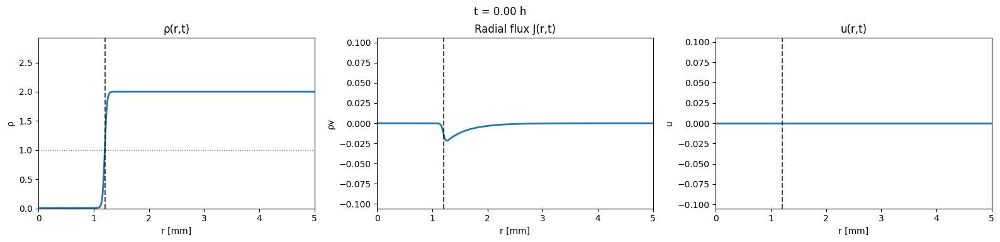

In [ ]:
# -------------------------------
# Animation: ρ, flux=ρv, u (with rim)
# -------------------------------
RHO = np.asarray(RHO_j); VEL = np.asarray(VEL_j); UTR = np.asarray(UTR_j)
RW  = np.asarray(EDGE_j); TT = np.asarray(TT_j);   r  = np.asarray(r_j)
FLUX = RHO * VEL

MAX_FRAMES = 100
inds = np.linspace(0, len(TT)-1, MAX_FRAMES).astype(int)

RHO_s  = RHO[inds]; FLUX_s = FLUX[inds]; UTR_s = UTR[inds]; RW_s = RW[inds]; TT_s = TT[inds]
r_np   = r

fig, axs = plt.subplots(1, 3, figsize=(16,4), sharex=False)

RHO_YMIN, RHO_YMAX = 0.0, float(np.nanmax(RHO))+0.5
flux_abs = float(np.nanmax(np.abs(FLUX))); flux_ylim = (-1.05*flux_abs, 1.05*flux_abs)
u_abs = float(np.nanmax(np.abs(UTR))); u_ylim = (-1.05*u_abs, 1.05*u_abs)

# Panel 1: density
axs[0].set_xlim(0, R); axs[0].set_ylim(RHO_YMIN, RHO_YMAX)
line_rho, = axs[0].plot(r_np, RHO_s[0], lw=2)
edge1,     = axs[0].plot([RW_s[0], RW_s[0]], [RHO_YMIN, RHO_YMAX], 'k--', alpha=0.7)
axs[0].axhline(rho_thr, ls=':', c='gray', lw=1)
axs[0].set_xlabel('r [mm]'); axs[0].set_ylabel('ρ'); axs[0].set_title('ρ(r,t)')

# Panel 2: radial flux
axs[1].set_xlim(0, R); axs[1].set_ylim(*flux_ylim)
line_flux, = axs[1].plot(r_np, FLUX_s[0], lw=2)
edge2,     = axs[1].plot([RW_s[0], RW_s[0]], [flux_ylim[0], flux_ylim[1]], 'k--', alpha=0.7)
axs[1].set_xlabel('r [mm]'); axs[1].set_ylabel('ρv'); axs[1].set_title('Radial flux J(r,t)')

# Panel 3: control
axs[2].set_xlim(0, R); axs[2].set_ylim(*u_ylim)
line_u,  = axs[2].plot(r_np, UTR_s[0], lw=2)
edge3,   = axs[2].plot([RW_s[0], RW_s[0]], [u_ylim[0], u_ylim[1]], 'k--', alpha=0.7)
axs[2].set_xlabel('r [mm]'); axs[2].set_ylabel('u'); axs[2].set_title('u(r,t)')

ttl = fig.suptitle(f"t = {float(TT_s[0]):.2f} h", y=0.95, fontsize=12)
plt.tight_layout()

def init():
    line_rho.set_data(r_np, RHO_s[0]); edge1.set_data([RW_s[0], RW_s[0]], [RHO_YMIN, RHO_YMAX])
    line_flux.set_data(r_np, FLUX_s[0]); edge2.set_data([RW_s[0], RW_s[0]], [flux_ylim[0], flux_ylim[1]])
    line_u.set_data(r_np, UTR_s[0]); edge3.set_data([RW_s[0], RW_s[0]], [u_ylim[0], u_ylim[1]])
    ttl.set_text(f"t = {float(TT_s[0]):.2f} h")
    return line_rho, edge1, line_flux, edge2, line_u, edge3, ttl

def update(i):
    line_rho.set_data(r_np, RHO_s[i]); edge1.set_data([RW_s[i], RW_s[i]], [RHO_YMIN, RHO_YMAX])
    line_flux.set_data(r_np, FLUX_s[i]); edge2.set_data([RW_s[i], RW_s[i]], [flux_ylim[0], flux_ylim[1]])
    line_u.set_data(r_np, UTR_s[i]); edge3.set_data([RW_s[i], RW_s[i]], [u_ylim[0], u_ylim[1]])
    ttl.set_text(f"t = {float(TT_s[i]):.2f} h")
    return line_rho, edge1, line_flux, edge2, line_u, edge3, ttl

ani = animation.FuncAnimation(fig, update, frames=len(TT_s),
                              init_func=init, blit=False, interval=60)
HTML(ani.to_jshtml())

In [ ]:
# ======================================================================
# --- Save animation as MP4 (Option A) ---
from matplotlib import animation

# If ffmpeg isn't on PATH, set it explicitly:
# import matplotlib as mpl
# mpl.rcParams['animation.ffmpeg_path'] = "/usr/bin/ffmpeg"

fps = max(1, int(1000 / 50))  # interval=50 ms → ~20 fps
writer = animation.FFMpegWriter(fps=fps, bitrate=1800, metadata={'artist':'wound-oc'})

ani.save("unconstrained_all_fields.mp4", writer=writer, dpi=160)

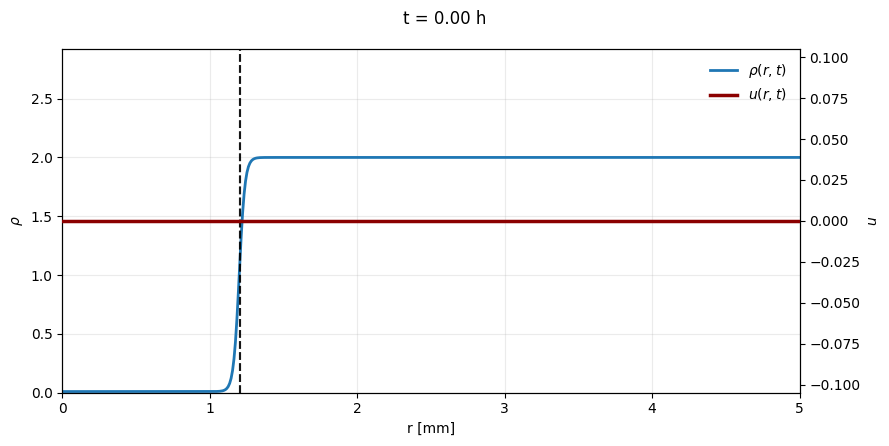

In [ ]:
# ================= Single-panel animation: ρ(r,t) + u(r,t) with rim =================
# Uses twin y-axes: left for ρ, right for u
from matplotlib import animation
from IPython.display import HTML

# Inputs already defined above:
# RHO (Nt, Nr), UTR (Nt, Nr), RW (Nt,), TT (Nt,), r (Nr,), R
# Optional: downsample frames to keep HTML light
MAX_FRAMES = 100
inds = np.linspace(0, len(TT) - 1, MAX_FRAMES).astype(int)

RHO_s = np.asarray(RHO)[inds]
UTR_s = np.asarray(UTR)[inds]
RW_s  = np.asarray(RW)[inds]
TT_s  = np.asarray(TT)[inds]
r_np  = np.asarray(r)

# Axis + limits
fig, ax = plt.subplots(1, 1, figsize=(9, 4.5))
ax2 = ax.twinx()  # right y-axis for u

rho_ymin, rho_ymax = 0.0, float(np.nanmax(RHO) + 0.5)
u_abs = float(np.nanmax(np.abs(UTR)))
u_ylim = (-1.05*u_abs, 1.05*u_abs) if u_abs > 0 else (-1.0, 1.0)

ax.set_xlim(0, R)
ax.set_ylim(rho_ymin, rho_ymax)
ax2.set_ylim(*u_ylim)

# Lines
(line_rho,) = ax.plot(r_np, np.clip(RHO_s[0], rho_ymin, rho_ymax), lw=2.0, label=r'$\rho(r,t)$')
(line_u,)   = ax2.plot(r_np, UTR_s[0], lw=2.5, color='#8B0000', alpha=1.0, zorder=5, label=r'$u(r,t)$')

# Rim drawn on both y-axes so it spans both scales
(edge_rho,) = ax.plot([RW_s[0], RW_s[0]], [rho_ymin, rho_ymax], 'k--', alpha=0.7)
(edge_u,)   = ax2.plot([RW_s[0], RW_s[0]], [u_ylim[0], u_ylim[1]], 'k--', alpha=0.7)

# Labels / title
ax.set_xlabel('r [mm]')
ax.set_ylabel(r'$\rho$')
ax2.set_ylabel(r'$u$')
ttl = fig.suptitle(f"t = {float(TT_s[0]):.2f} h", y=0.98, fontsize=12)
ax.grid(alpha=0.25)

# Legend (combine from both axes)
h1, l1 = ax.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax.legend(h1 + h2, l1 + l2, loc='upper right', frameon=False)

plt.tight_layout()

def init():
    line_rho.set_data(r_np, np.clip(RHO_s[0], rho_ymin, rho_ymax))
    line_u.set_data(r_np, UTR_s[0])
    edge_rho.set_data([RW_s[0], RW_s[0]], [rho_ymin, rho_ymax])
    edge_u.set_data([RW_s[0], RW_s[0]], [u_ylim[0], u_ylim[1]])
    ttl.set_text(f"t = {float(TT_s[0]):.2f} h")
    return line_rho, line_u, edge_rho, edge_u, ttl

def update(i):
    line_rho.set_data(r_np, np.clip(RHO_s[i], rho_ymin, rho_ymax))
    line_u.set_data(r_np, UTR_s[i])
    edge_rho.set_data([RW_s[i], RW_s[i]], [rho_ymin, rho_ymax])
    edge_u.set_data([RW_s[i], RW_s[i]], [u_ylim[0], u_ylim[1]])
    ttl.set_text(f"t = {float(TT_s[i]):.2f} h")
    return line_rho, line_u, edge_rho, edge_u, ttl

ani = animation.FuncAnimation(
    fig, update, frames=len(TT_s),
    init_func=init, blit=False, interval=60
)

HTML(ani.to_jshtml())
# Optionally save:
# ani.save("rho_and_u_single_panel.mp4", dpi=150, fps=20)


In [ ]:
ani.save("rho_and_u_single_panel.mp4", dpi=150, fps=20)

/tmp/ipython-input-1151704320.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(frameon=True)


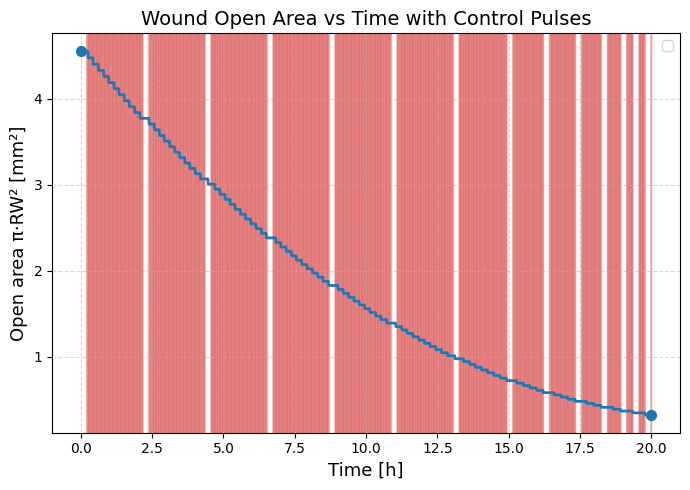

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assume RW, TT, and UTR already exist as arrays
TT_np   = np.asarray(TT, dtype=float)
RW_np   = np.asarray(RW, dtype=float)
area_np = np.pi * RW_np**2
UTR_np  = np.asarray(UTR)   # shape (Nt, Nr), control in space and time

# Compute total ON fraction at each time (mean abs(u)>0 across r)
on_frac = np.mean(np.abs(UTR_np) > 1e-10, axis=1)

plt.figure(figsize=(7,5))
plt.plot(TT_np, area_np, lw=2, color='tab:blue')
plt.scatter([TT_np[0], TT_np[-1]], [area_np[0], area_np[-1]],
            color='tab:blue', s=50, zorder=5)

# Shade intervals where control is ON
is_on = on_frac > 0.0
for i in range(len(TT_np)-1):
    if is_on[i]:
        plt.axvspan(TT_np[i], TT_np[i+1], color='tab:red', alpha=0.15,
                    label='control ON' if i==0 else None)

plt.xlabel("Time [h]", fontsize=13)
plt.ylabel("Open area π·RW² [mm²]", fontsize=13)
plt.title("Wound Open Area vs Time with Control Pulses", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig("fig_area_vs_time_with_pulses.pdf", format="pdf", bbox_inches="tight")
plt.show()

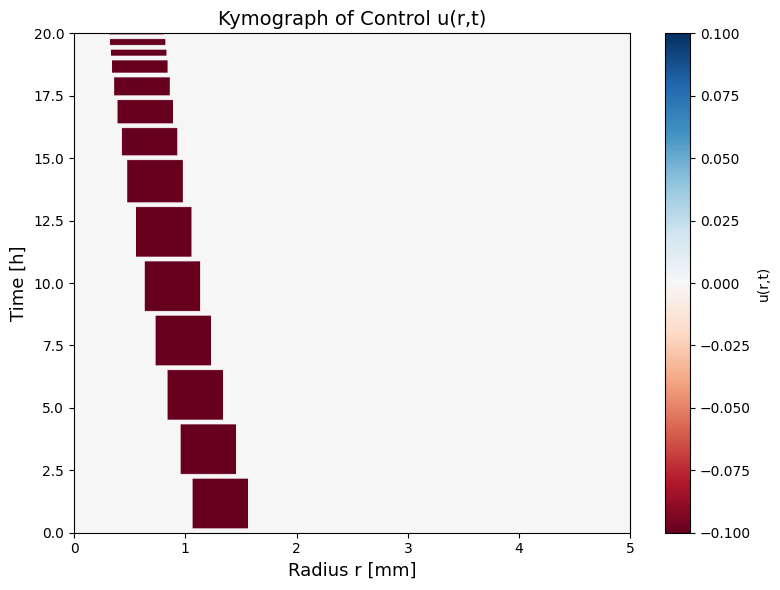

In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path

# Assume UTR_j has shape (Nt, Nr), TT_j (Nt,), r_j (Nr,)
UTR_np = np.asarray(UTR_j)
TT_np  = np.asarray(TT_j, dtype=float)
r_np   = np.asarray(r_j, dtype=float)

outdir = Path("results")
outdir.mkdir(parents=True, exist_ok=True)

np.savez_compressed(outdir / "wound_run_compressed.npz",
                    UTR=UTR_np, TT=TT_np, r=r_np,
                    meta=np.array({
                        "note": "UTR(t,r) with time/r grids",
                        "UTR_shape": UTR_np.shape,
                        "dtype": str(UTR_np.dtype)
                    }, dtype=object))





plt.figure(figsize=(8,6))
im = plt.imshow(UTR_np, aspect='auto', origin='lower',
                extent=[r_np[0], r_np[-1], TT_np[0], TT_np[-1]],
                cmap='RdBu', vmin=-np.max(np.abs(UTR_np)), vmax=np.max(np.abs(UTR_np)))

plt.colorbar(im, label="u(r,t)")
plt.xlabel("Radius r [mm]", fontsize=13)
plt.ylabel("Time [h]", fontsize=13)
plt.title("Kymograph of Control u(r,t)", fontsize=14)
plt.grid(False)
plt.tight_layout()
plt.savefig("fig_ctrl_kymograph.pdf", format="pdf", bbox_inches="tight")
plt.show()

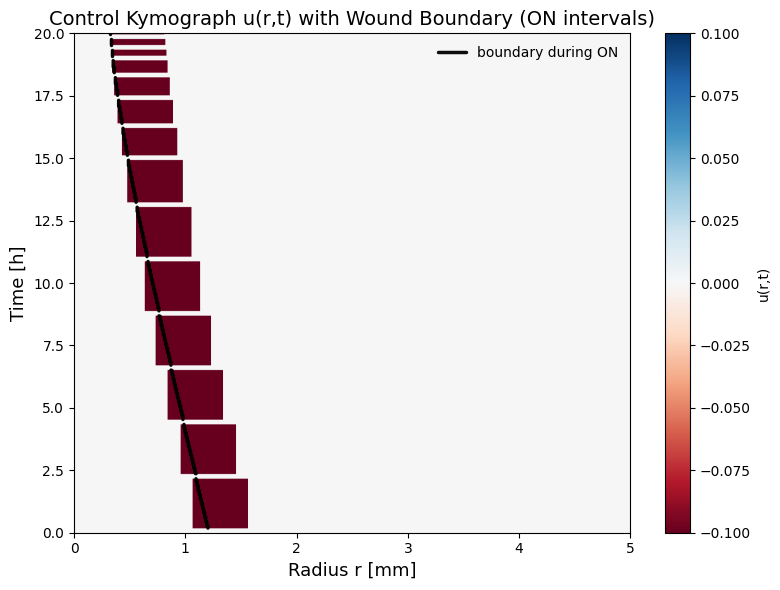

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Given:
#   UTR_np : (Nt, Nr) control field u(t, r)
#   TT_np  : (Nt,)    time grid
#   r_np   : (Nr,)    radius grid
#   RW_np  : (Nt,)    wound boundary radius r_w(t)

# --- derive ON/OFF from control field ---
# "ON" if any |u|>1e-10 across radius at that time
on_frac = np.mean(np.abs(UTR_np) > 1e-10, axis=1)
on_mask = (on_frac > 0.0).astype(int)

# contiguous ON segments: [start, end) in time index space
starts = np.where((on_mask[1:] == 1) & (on_mask[:-1] == 0))[0] + 1
ends   = np.where((on_mask[1:] == 0) & (on_mask[:-1] == 1))[0] + 1
if on_mask[0] == 1:
    starts = np.r_[0, starts]
if on_mask[-1] == 1:
    ends = np.r_[ends, len(on_mask)]

# --- make output dir & save compressed bundle (optional) ---
#outdir = Path("results")
outdir.mkdir(parents=True, exist_ok=True)
np.savez_compressed(outdir / "wound_kymo_with_boundary_data.npz",
                    UTR=UTR_np, TT=TT_np, r=r_np, RW=RW_np,
                    meta=np.array({"note": "Kymograph inputs + boundary"}, dtype=object))

# --- kymograph ---
plt.figure(figsize=(8,6))

vabs = float(np.nanmax(np.abs(UTR_np))) if np.isfinite(UTR_np).any() else 1.0
im = plt.imshow(
    UTR_np,
    aspect='auto', origin='lower',
    extent=[r_np[0], r_np[-1], TT_np[0], TT_np[-1]],
    cmap='RdBu',
    vmin=-vabs, vmax=vabs
)

plt.colorbar(im, label="u(r,t)")
plt.xlabel("Radius r [mm]", fontsize=13)
plt.ylabel("Time [h]", fontsize=13)
plt.title("Control Kymograph u(r,t) with Wound Boundary (ON intervals)", fontsize=14)
plt.grid(False)

# Plot the full boundary as faint context (optional)
#plt.plot(RW_np, TT_np, linestyle='--', color='k', lw=1.0, alpha=0.4, label="boundary (all t)")

# Overlay boundary only during ON segments, thicker & opaque
for s, e in zip(starts, ends):
    if e > s:
        plt.plot(RW_np[s:e], TT_np[s:e],
                 color='k', lw=2.5, alpha=0.95, solid_capstyle='round',
                 label="boundary during ON" if s == starts[0] else None)

plt.legend(frameon=False, fontsize=10, loc='upper right')
plt.tight_layout()
plt.savefig(outdir / "fig_ctrl_kymograph_with_boundary.pdf", format="pdf", bbox_inches="tight")
plt.show()


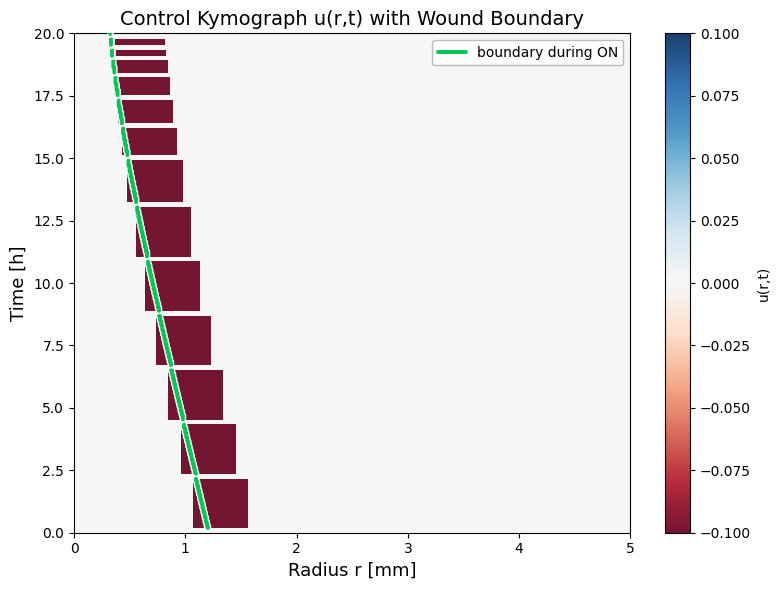

In [ ]:
import matplotlib.patheffects as pe
import matplotlib.lines as mlines

fig, ax = plt.subplots(figsize=(8,6))

# --- image ---
vabs = float(np.nanmax(np.abs(UTR_np))) if np.isfinite(UTR_np).any() else 1.0
im = ax.imshow(
    UTR_np, aspect='auto', origin='lower',
    extent=[r_np[0], r_np[-1], TT_np[0], TT_np[-1]],
    cmap='RdBu', vmin=-vabs, vmax=vabs, interpolation='nearest'
)
im.set_alpha(0.92)
im.set_zorder(0)
cbar = fig.colorbar(im, ax=ax, label="u(r,t)")

# --- boundary overlays ---
green   = '#00c853'
lw_all  = 1.4
lw_on   = 2.8

# full boundary (context)
#ax.plot(
#    RW_np, TT_np, linestyle='--', color=green, lw=lw_all, alpha=0.5,
#    zorder=3, path_effects=[pe.Stroke(linewidth=lw_all+1.2, foreground='white', alpha=0.7), pe.Normal()],
#    label="boundary (all t)"
#)

# ON segments
first = True
for s, e in zip(starts, ends):
    if e > s:
        ax.plot(
            RW_np[s:e], TT_np[s:e],
            color=green, lw=lw_on, alpha=1.0, solid_capstyle='round', zorder=4,
            path_effects=[pe.Stroke(linewidth=lw_on+2.0, foreground='white'), pe.Normal()],
            label="boundary during ON" if first else None
        )
        first = False

# --- labels & title ---
ax.set_xlabel("Radius r [mm]", fontsize=13)
ax.set_ylabel("Time [h]", fontsize=13)
ax.set_title("Control Kymograph u(r,t) with Wound Boundary", fontsize=14)
ax.grid(False)

# --- legend (deduplicate & readable over image) ---
handles, labels = ax.get_legend_handles_labels()
uniq = dict(zip(labels, handles))  # de-dupe by label
leg = ax.legend(
    uniq.values(), uniq.keys(), loc='upper right', frameon=True, framealpha=0.85,
    facecolor='white', edgecolor='0.7', fontsize=10
)

fig.tight_layout()
fig.savefig(outdir / "fig_ctrl_kymograph_with_boundary_labeled.pdf", bbox_inches="tight")
plt.show()



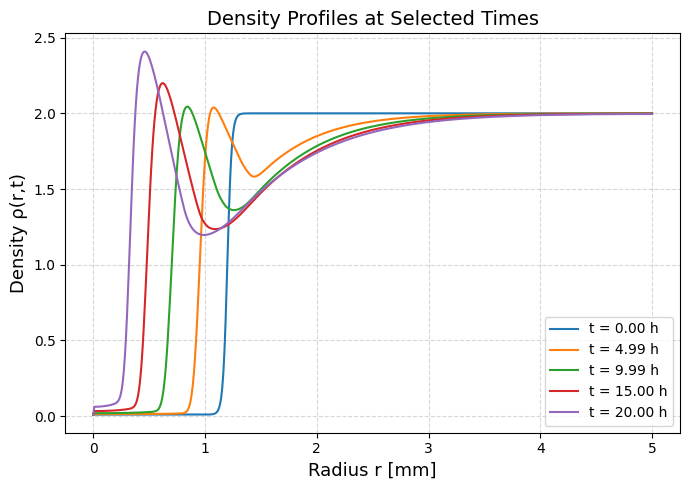

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assume RHO_j has shape (Nt, Nr), TT_j (Nt,), r_j (Nr,)
RHO_np = np.asarray(RHO_j)   # density history
TT_np  = np.asarray(TT_j)    # time points
r_np   = np.asarray(r_j)     # spatial grid

# Pick 5 evenly spaced times
n_curves = 5
indices = np.linspace(0, len(TT_np)-1, n_curves, dtype=int)

plt.figure(figsize=(7,5))
for idx in indices:
    plt.plot(r_np, RHO_np[idx], lw=1.5,
             label=f"t = {TT_np[idx]:.2f} h")

plt.xlabel("Radius r [mm]", fontsize=13)
plt.ylabel("Density ρ(r,t)", fontsize=13)
plt.title("Density Profiles at Selected Times", fontsize=14)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig("fig_density_profiles.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [ ]:
ls

results/


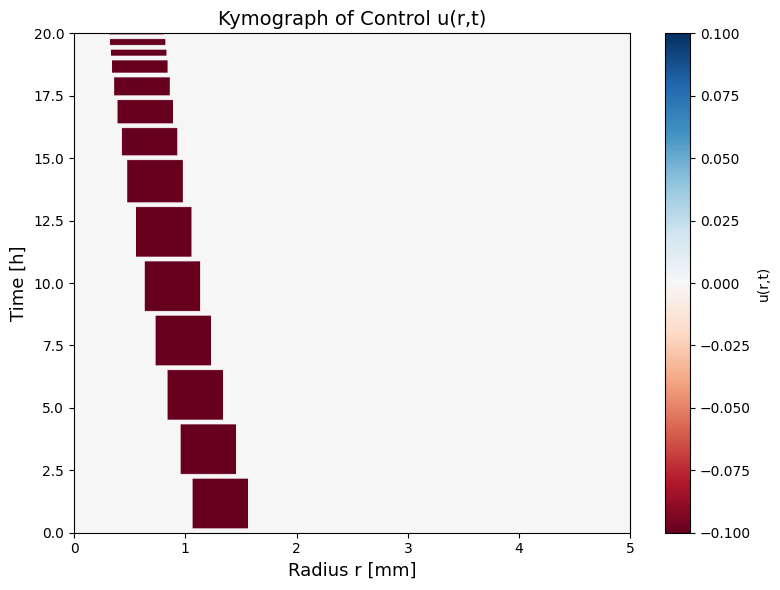

In [ ]:
data = np.load("results/wound_run_compressed.npz", allow_pickle=True)
UTR = data["UTR"]      # shape (Nt, Nr)
TT  = data["TT"]       # shape (Nt,)
r   = data["r"]        # shape (Nr,)
meta = data["meta"].item()  # dict if you saved one

plt.figure(figsize=(8,6))
im = plt.imshow(UTR_np, aspect='auto', origin='lower',
                extent=[r_np[0], r_np[-1], TT_np[0], TT_np[-1]],
                cmap='RdBu', vmin=-np.max(np.abs(UTR_np)), vmax=np.max(np.abs(UTR_np)))

plt.colorbar(im, label="u(r,t)")
plt.xlabel("Radius r [mm]", fontsize=13)
plt.ylabel("Time [h]", fontsize=13)
plt.title("Kymograph of Control u(r,t)", fontsize=14)
plt.grid(False)
plt.tight_layout()
plt.savefig("fig_ctrl_kymograph.pdf", format="pdf", bbox_inches="tight")
plt.show()


meta: {'note': 'Kymograph inputs + boundary'}


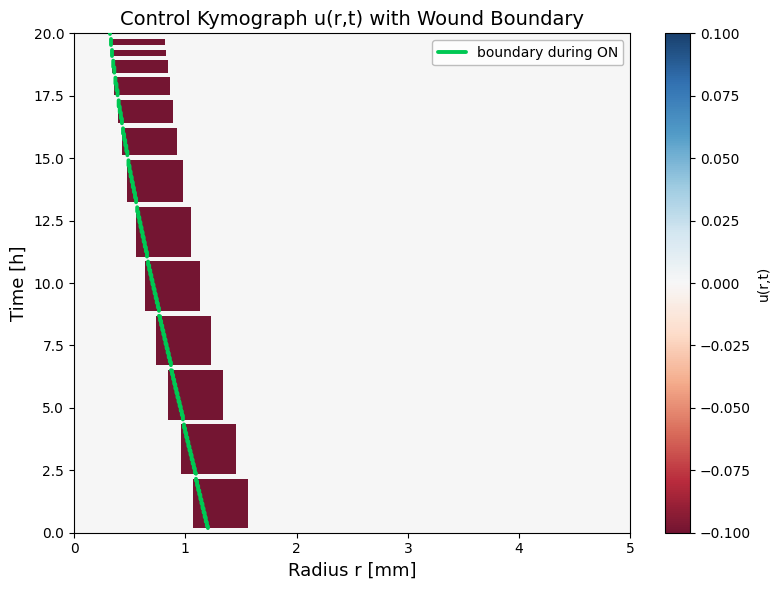

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from pathlib import Path

# --- load ---
path = Path("results/wound_kymo_with_boundary_data.npz")  # adjust if needed
data = np.load(path, allow_pickle=True)

# expected keys: 'UTR', 'TT', 'r', 'RW' (and maybe 'meta')
UTR_np = data["UTR"]          # (Nt, Nr)
TT_np  = data["TT"].astype(float)   # (Nt,)
r_np   = data["r"].astype(float)    # (Nr,)
RW_np  = data["RW"].astype(float)   # (Nt,)

# (optional) peek at meta
if "meta" in data.files:
    print("meta:", data["meta"])

# --- derive ON/OFF from control field ---
on_frac = np.mean(np.abs(UTR_np) > 1e-10, axis=1)     # fraction of r with |u|>0
on_mask = (on_frac > 0.0).astype(int)

# contiguous ON segments [start, end)
starts = np.where((on_mask[1:] == 1) & (on_mask[:-1] == 0))[0] + 1
ends   = np.where((on_mask[1:] == 0) & (on_mask[:-1] == 1))[0] + 1
if on_mask[0] == 1:
    starts = np.r_[0, starts]
if on_mask[-1] == 1:
    ends = np.r_[ends, len(on_mask)]

# --- plot ---
fig, ax = plt.subplots(figsize=(8,6))

vabs = float(np.nanmax(np.abs(UTR_np))) if np.isfinite(UTR_np).any() else 1.0
im = ax.imshow(
    UTR_np, aspect='auto', origin='lower',
    extent=[r_np[0], r_np[-1], TT_np[0], TT_np[-1]],
    cmap='RdBu', vmin=-vabs, vmax=vabs, interpolation='nearest'
)
im.set_alpha(0.92)               # helps overlays pop
im.set_zorder(0)

cbar = fig.colorbar(im, ax=ax, label="u(r,t)")

# boundary overlays
green = "#00c853"; lw_all = 1.4; lw_on = 2.8

# full boundary (context)
#ax.plot(
#    RW_np, TT_np, linestyle='--', color=green, lw=lw_all, alpha=0.5, zorder=3,
#    path_effects=[pe.Stroke(linewidth=lw_all+1.2, foreground='white', alpha=0.7), pe.Normal()],
#    label="boundary (all t)"
#)

# ON segments (thicker and bright)
first = True
for s, e in zip(starts, ends):
    if e > s:
        ax.plot(
            RW_np[s:e], TT_np[s:e],
            color=green, lw=lw_on, solid_capstyle='round', zorder=4,
            path_effects=[pe.Stroke(linewidth=0.5*lw_on, foreground='white'), pe.Normal()],
            label="boundary during ON" if first else None
        )
        first = False

# labels/legend
ax.set_xlabel("Radius r [mm]", fontsize=13)
ax.set_ylabel("Time [h]", fontsize=13)
ax.set_title("Control Kymograph u(r,t) with Wound Boundary", fontsize=14)
ax.grid(False)

handles, labels = ax.get_legend_handles_labels()
uniq = dict(zip(labels, handles))  # de-dupe entries
ax.legend(uniq.values(), uniq.keys(), loc='upper right',
          frameon=True, framealpha=0.85, facecolor='white', edgecolor='0.7', fontsize=10)

fig.tight_layout()
fig.savefig(Path("results/fig_ctrl_kymograph_from_npz.pdf"), bbox_inches="tight")
plt.show()
